# zip()函数
> zip() 函数用于将可迭代的对象作为参数，将对象中对应的元素打包成一个个元组，然后返回由这些元组组成的对象，这样做的好处是节约了不少的内存。

>>我们可以使用 list() 转换来输出列表。

>>>如果各个迭代器的元素个数不一致，则返回列表长度与最短的对象相同，利用 * 号操作符，可以将元组解压为列表。
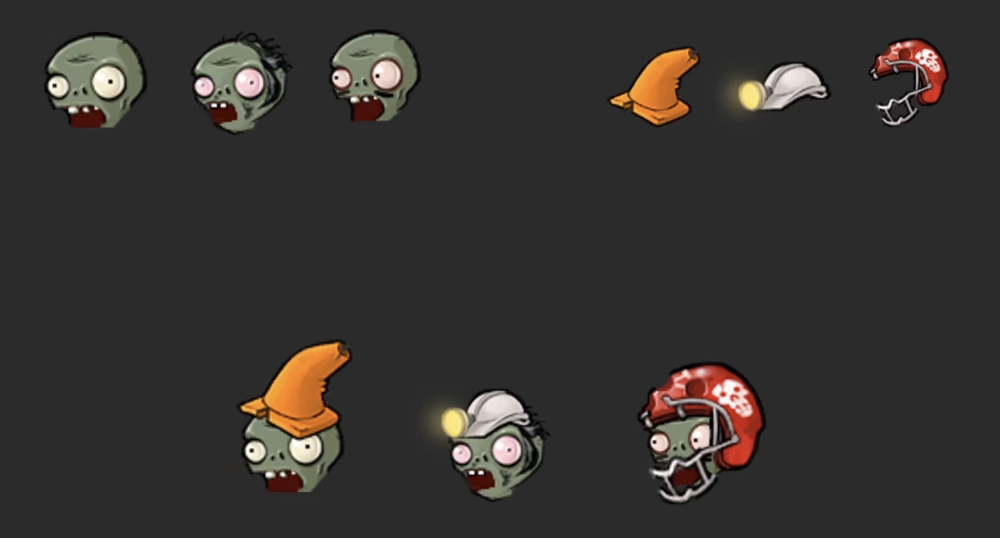

In [1]:
a = ["a1", "a2", "a3"]
b = ["b1", "b2", "b3"]
c = ["c1", "c2", "c3", "c4", "c5"]

In [2]:
zipped_ab = zip(a, b)

In [3]:
zipped_ac = zip(a, c)

In [4]:
zipped_abc = zip(a, b, c)

In [20]:
print(zip(a, b))

In [5]:
list(zip(a,b))

[('a1', 'b1'), ('a2', 'b2'), ('a3', 'b3')]

In [17]:
print(*zip(a, b))

('a1', 'b1') ('a2', 'b2') ('a3', 'b3')


In [19]:
[zip for zip in [*zip(a,b)]]

[('a1', 'b1'), ('a2', 'b2'), ('a3', 'b3')]

In [11]:
print(zip(*zip(a, b)))

In [7]:
list(zip(*zip(a, b)))

[('a1', 'a2', 'a3'), ('b1', 'b2', 'b3')]

In [9]:
list(zip(zip(a, b)))

[(('a1', 'b1'),), (('a2', 'b2'),), (('a3', 'b3'),)]

In [89]:
from itertools import zip_longest, starmap
from operator import add
origin_a = "ABCDEFG"
origin_b = "12345"
after_zip_longest = zip_longest(origin_a, origin_b, fillvalue="")
after_starmap = starmap(add, after_zip_longest)
print("".join(after_starmap))

A1B2C3D4E5FG


***一行代码***

In [93]:
print("".join(starmap(add, zip_longest("ABCDEFG", "12345", fillvalue=""))))

A1B2C3D4E5FG


***

# itertools 

![](./pic/itertools_001.png)

## 无限Iterators

## 压缩
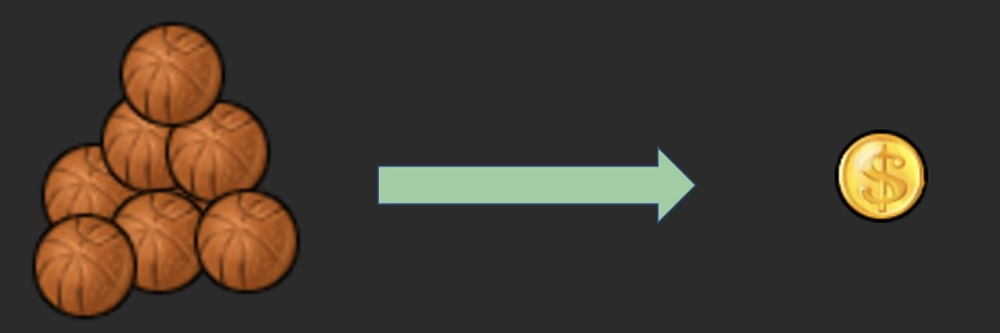

#### ***reduce()***

In [19]:
from functools import reduce
origin = range(1, 6)
after_reduce = reduce(lambda a, b: a * b, origin)
print(after_reduce)

120


In [21]:
from functools import reduce
from operator import mul
origin = range(1, 6)
after_reduce = reduce(mul, origin)

print(after_reduce)

120


In [ ]:
from functools import reduce
def factorial(n):
    return reduce(lambda a, b: a*b, range(1, n+1))

print(factorial(5))

In [22]:
def factorial(n):
    return eval("*".join([str(i) for i in range(1, n+1)]))

print(factorial(5))

120


In [23]:
def factorial(n):
    return 1 if n==0 else n*factorial(n-1)

print(factorial(5))

120


#### groupby()

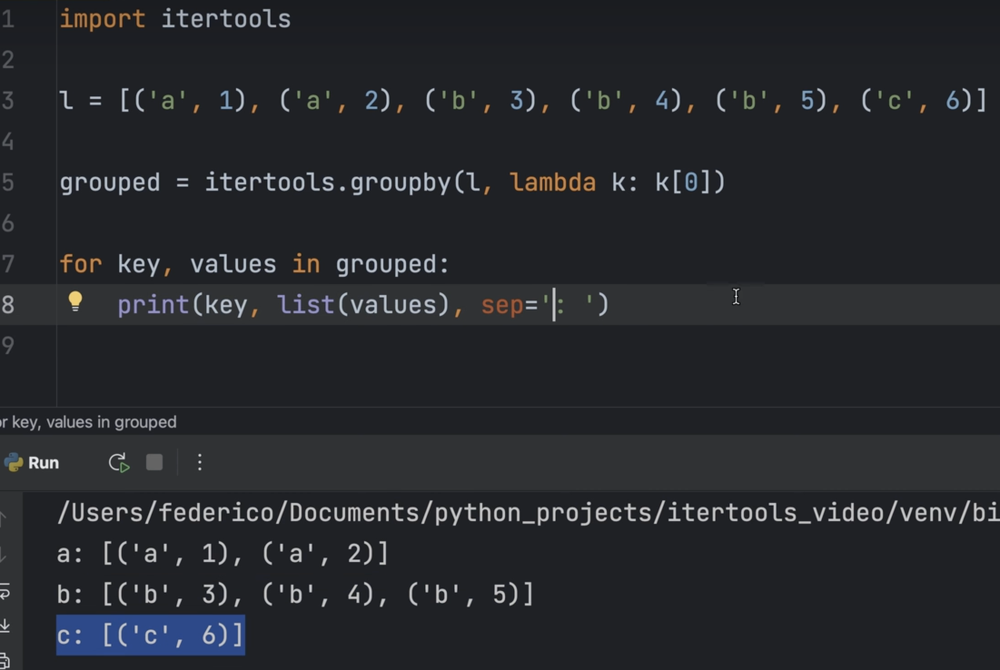
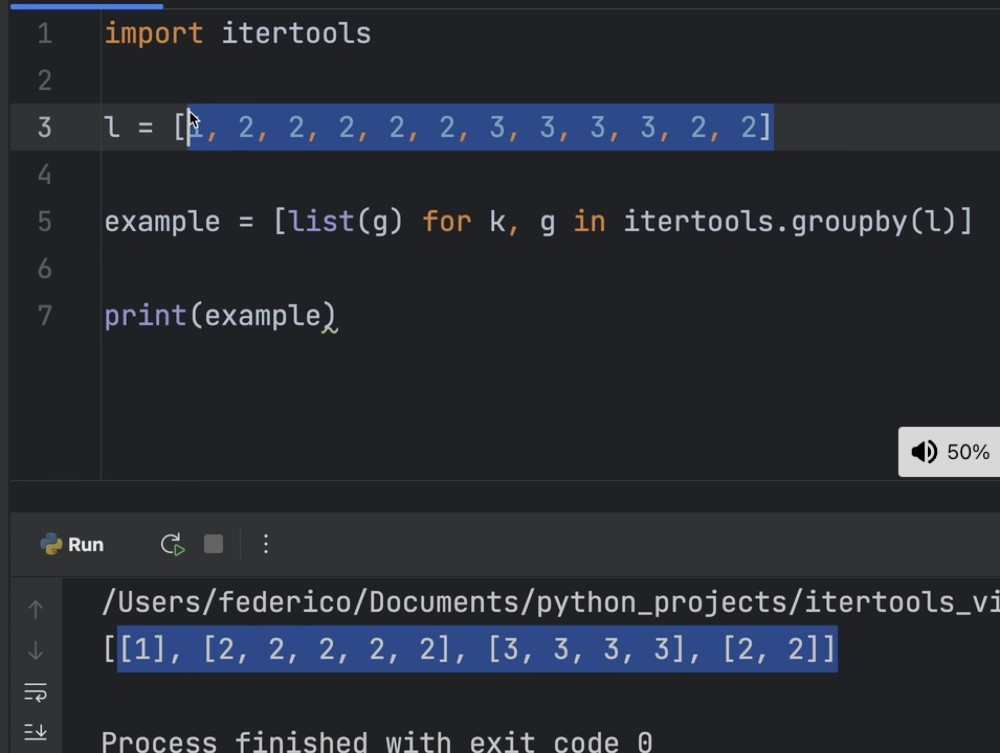
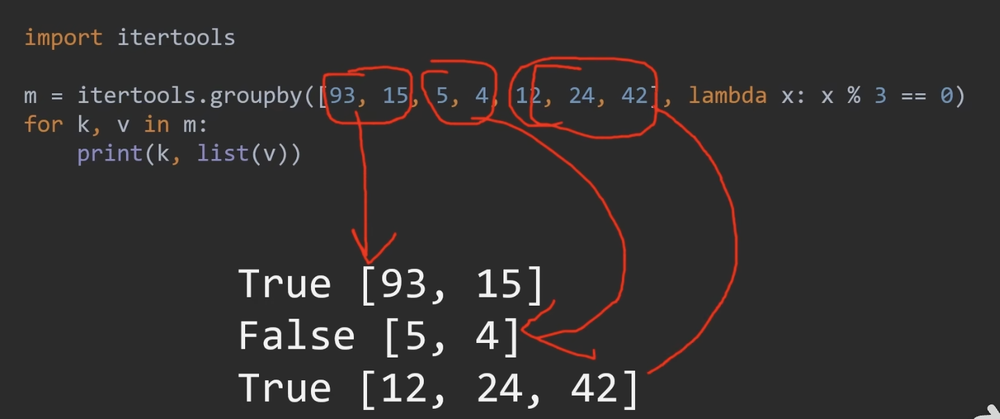

#### min()

#### max()

#### any()

#### all()

### count()

##### 1. count(0)

In [40]:
from itertools import count
counter = count(0)

In [41]:
for i in counter:
    print(i)
    if i > 9:
        break

0
1
2
3
4
5
6
7
8
9
10


---

##### 2. count(0,5)

In [101]:
from itertools import count
for a, b in zip(count(1), count(2, 2)):
    print(a**b)
    if a == 10:
        break

1
16
729
65536
9765625
2176782336
678223072849
281474976710656
150094635296999121
100000000000000000000


In [102]:
origin = map(int, "1234543234")
for i, item in enumerate(origin):
    print(i, item, sep=":")

0:1
1:2
2:3
3:4
4:5
5:4
6:3
7:2
8:3
9:4


**等价于**

In [103]:
origin = map(int, "1234543234")
for i, item in zip(count(0), origin):
    print(i, item, sep=":")

0:1
1:2
2:3
3:4
4:5
5:4
6:3
7:2
8:3
9:4


**更灵活**

In [105]:
origin = map(int, "1234543234")
for i, item in zip(count(0,2), origin):
    print(i, item, sep=":")

0:1
2:2
4:3
6:4
8:5
10:4
12:3
14:2
16:3
18:4


### cycle()
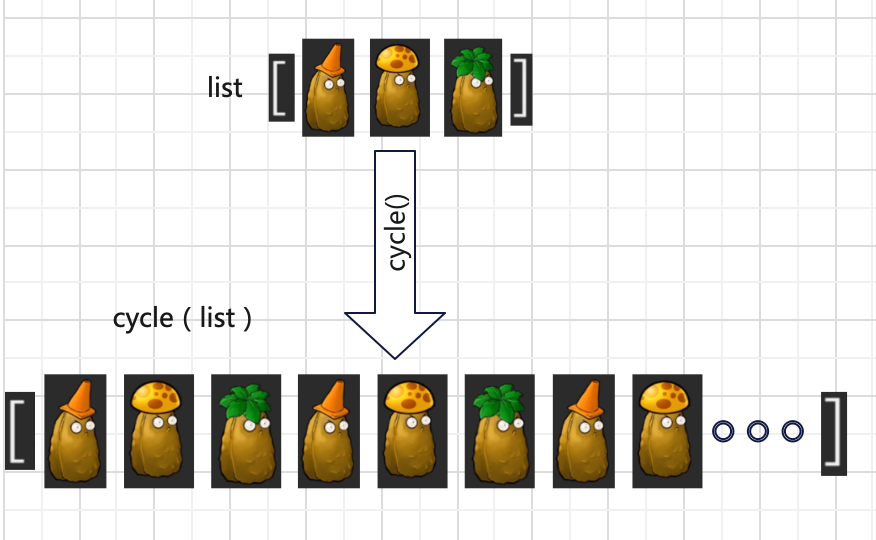

In [5]:
from itertools import cycle
name_list = ["Lantian", "Sunyang", "Lanxintian"]
cycler = cycle(name_list)

In [6]:
for i, person in enumerate(cycler):
    print(f"{i}:{person}")
    if i == 10:
        break
    

0:Lantian
1:Sunyang
2:Lanxintian
3:Lantian
4:Sunyang
5:Lanxintian
6:Lantian
7:Sunyang
8:Lanxintian
9:Lantian
10:Sunyang


正负号交替

In [108]:
from itertools import cycle
origin = map(int, "1234543234")
for a, b in zip(cycle([1,-1]), origin):
    print(a*b)

[1]
[-2]
[3]
[-4]
[5]
[-4]
[3]
[-2]
[3]
[-4]


In [110]:
from itertools import cycle
origin = map(int, "1234543234")
after_cycle = [a*b for a, b in zip(cycle([1, -1]), origin)]
print(after_cycle)

[1, -2, 3, -4, 5, -4, 3, -2, 3, -4]


### repeat() 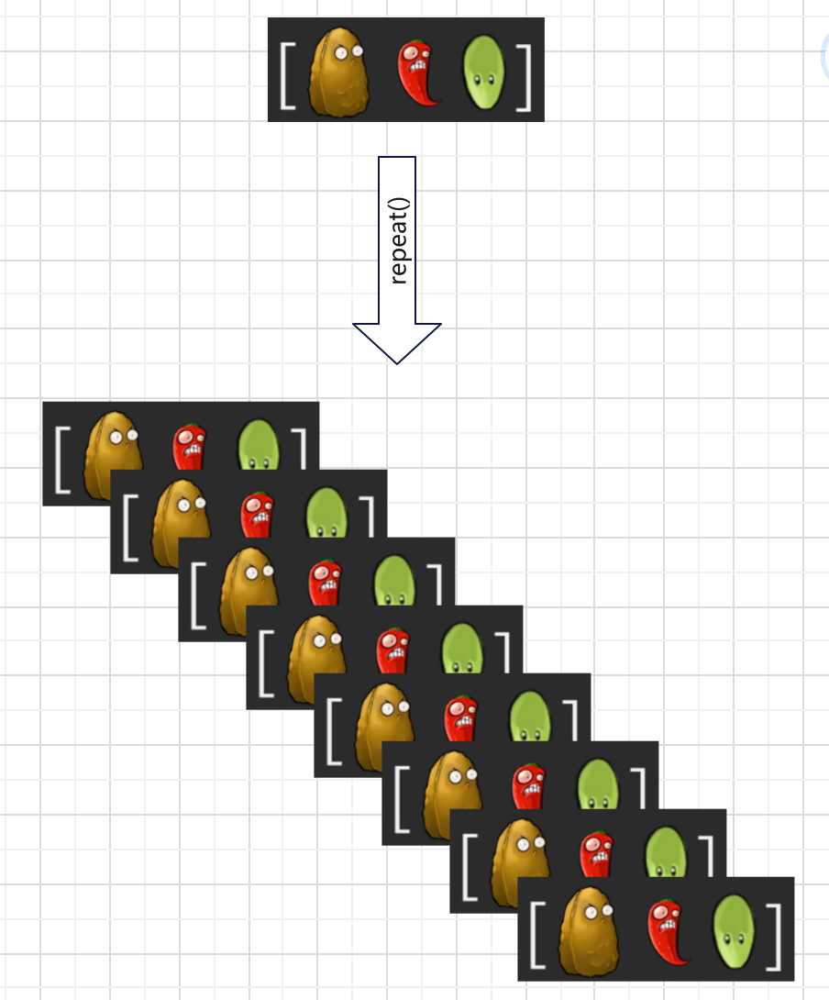

In [59]:
from itertools import repeat
str = "I love you"
repeater = repeat(str, 10)
print(repeater)

repeat('I love you', 10)


In [9]:
for str in repeater:
    print(str)

I love you
I love you
I love you
I love you
I love you
I love you
I love you
I love you
I love you
I love you


### tee() v.s. repeat()

In [60]:
from itertools import tee
origin = [1, 2, 3, "a", "b", "c"]
after_teed = tee(origin, 3)
print(list(after_teed))

[<itertools._tee object at 0x107fe9940>, <itertools._tee object at 0x107fe9e40>, <itertools._tee object at 0x107febc40>]


In [71]:
from itertools import tee
origin = [1, 2, 3, "a", "b", "c"]
after_teed = tee(origin, 3)
print(after_teed)

(<itertools._tee object at 0x107a7cfc0>, <itertools._tee object at 0x107fe5c00>, <itertools._tee object at 0x107fe66c0>)


In [64]:
from itertools import tee
origin = [1, 2, 3, "a", "b", "c"]
after_teed = tee(origin, 3)
for tee in after_teed:
    print(list(tee))

[1, 2, 3, 'a', 'b', 'c']
[1, 2, 3, 'a', 'b', 'c']
[1, 2, 3, 'a', 'b', 'c']


In [70]:
from itertools import repeat
repeater = repeat(origin, 3)
print(repeater)

repeat([1, 2, 3, 'a', 'b', 'c'], 3)


In [67]:
from itertools import repeat
repeater = repeat(origin, 3)
for repeat in repeater:
    print(repeat)

[1, 2, 3, 'a', 'b', 'c']
[1, 2, 3, 'a', 'b', 'c']
[1, 2, 3, 'a', 'b', 'c']


## 转换/映射
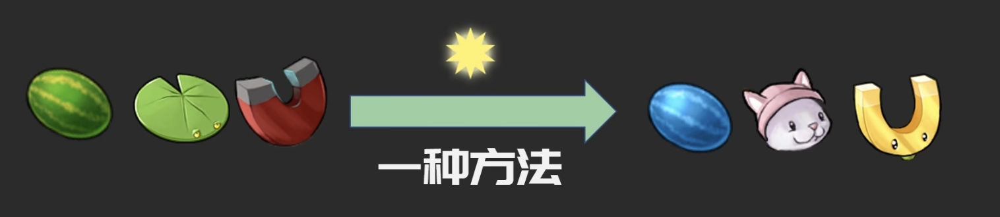

#### map()
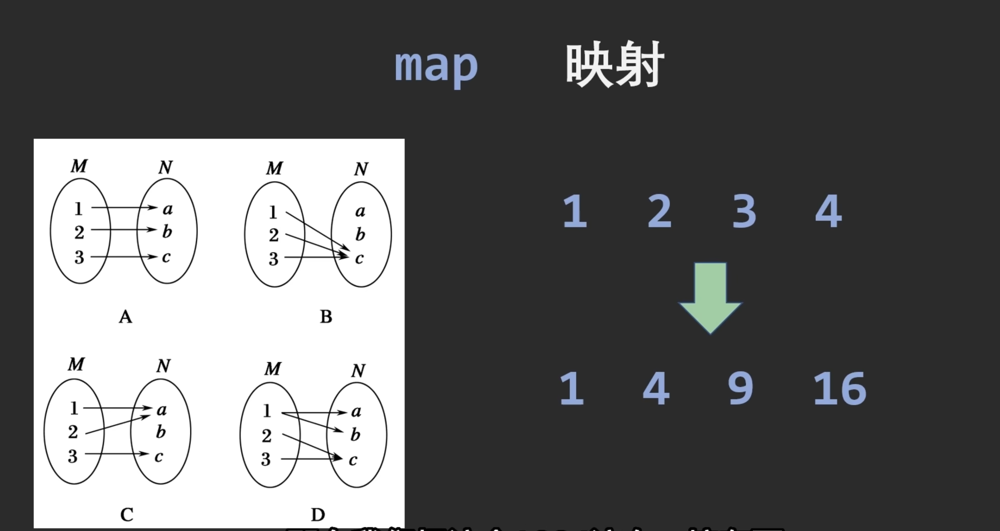
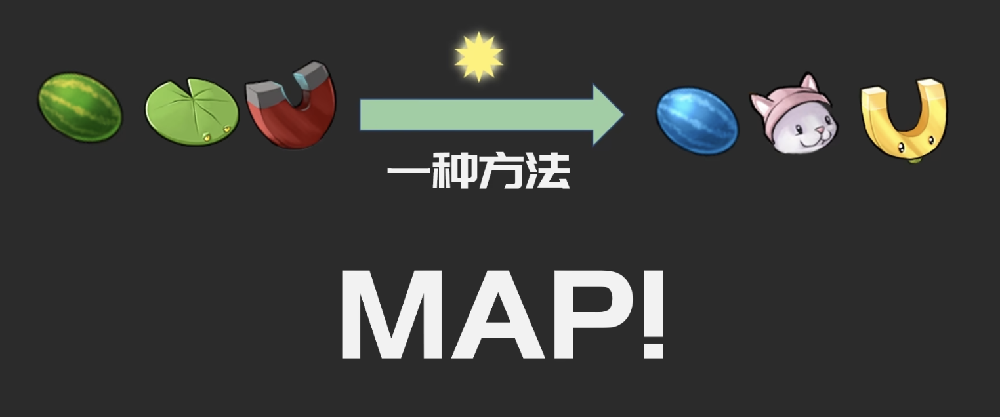

In [4]:
origin = range(1, 5)
after_map = map(lambda x: x**2, origin)
aprint(list(after_map))

[1, 4, 9, 16]


In [21]:
origin_str = "12345678965434523"
origin = list(map(int, origin_str))
after_map = map(lambda x: x**2, origin)
print(list(origin))
print(list(after_map))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 6, 5, 4, 3, 4, 5, 2, 3]
[1, 4, 9, 16, 25, 36, 49, 64, 81, 36, 25, 16, 9, 16, 25, 4, 9]


In [16]:
origin = list(map(int, "1238576366382"))
print(origin)

[1, 2, 3, 8, 5, 7, 6, 3, 6, 6, 3, 8, 2]


In [22]:
origin = list(map(int, "10 21 23 56 70 32 43".split()))
print(origin)

[10, 21, 23, 56, 70, 32, 43]


In [24]:
def up(s):
    return s.upper()
origin = list(map(up, ["lantian", "sunyang"]))
print(origin)

['LANTIAN', 'SUNYANG']


In [25]:
origin = list(map(str.upper, ["lantian", "sunyang"]))
print(origin)

['LANTIAN', 'SUNYANG']


#### **starmap()**
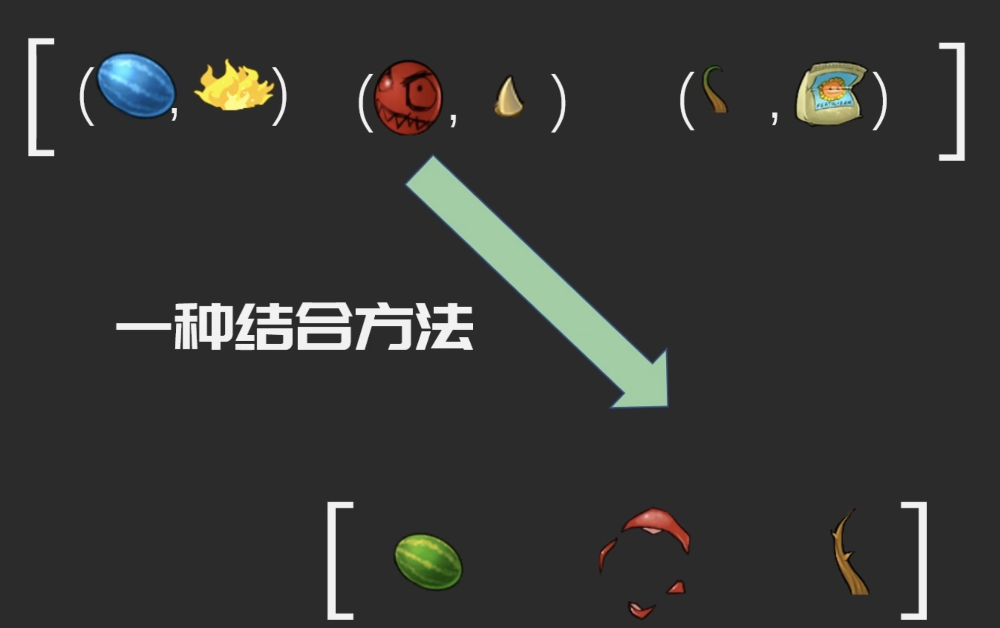

#### accumulate()

##### accumulate([])

In [23]:
from itertools import accumulate
numbers = range(1, 11)
accumulation = accumulate(numbers)
print(list(accumulation))

[1, 3, 6, 10, 15, 21, 28, 36, 45, 55]


##### accumulate([], operator.mul)

In [18]:
from itertools import accumulate
from operator import mul

In [24]:
numbers = range(1, 11)
accumulation_mul = accumulate(numbers, func=mul)
print(list(accumulation_mul))

[1, 2, 6, 24, 120, 720, 5040, 40320, 362880, 3628800]


#### chain()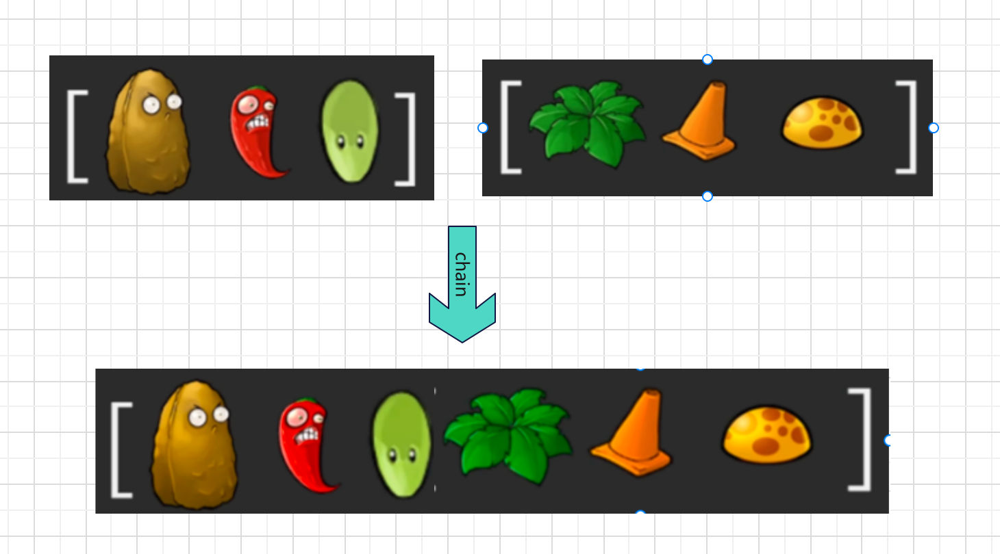

chain函数则是可以串联多个迭代对象来形成一个更大的迭代对象

In [66]:
from itertools import chain
origin_a = "ABC"
origin_b = "EFG"
after_chain = chain(origin_a, origin_b)
print(list(after_chain))

['A', 'B', 'C', 'E', 'F', 'G']


In [25]:
from itertools import chain
a = range(100, 106)
b = ["a", "b", "c", "d"]
c = ["lantian", "sunyang"]

In [26]:
long = chain(a, b, c, c, b, a)
print(list(long))

[100, 101, 102, 103, 104, 105, 'a', 'b', 'c', 'd', 'lantian', 'sunyang', 'lantian', 'sunyang', 'a', 'b', 'c', 'd', 100, 101, 102, 103, 104, 105]


#### chain.from_iterable()
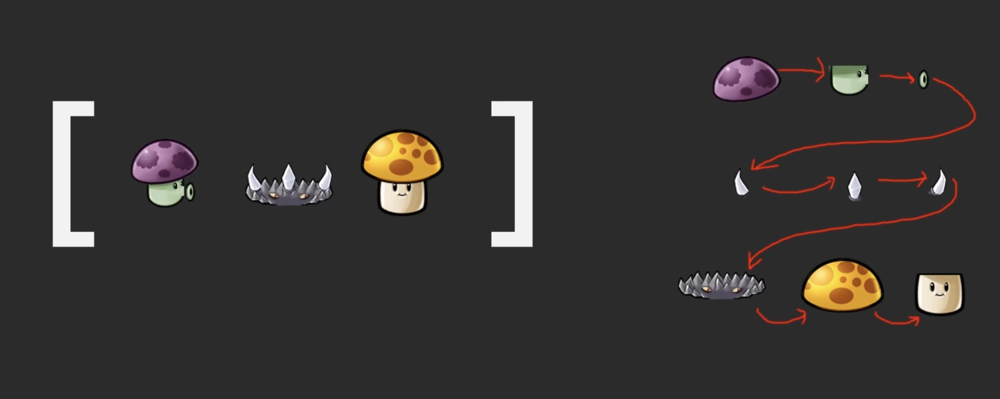

In [69]:
from itertools import chain
origin = ["ABC", "EFG", "XYZ", [1, 2, 3]]
after_chain = print(list(chain.from_iterable(origin)))

['A', 'B', 'C', 'E', 'F', 'G', 'X', 'Y', 'Z', 1, 2, 3]


## 过滤 
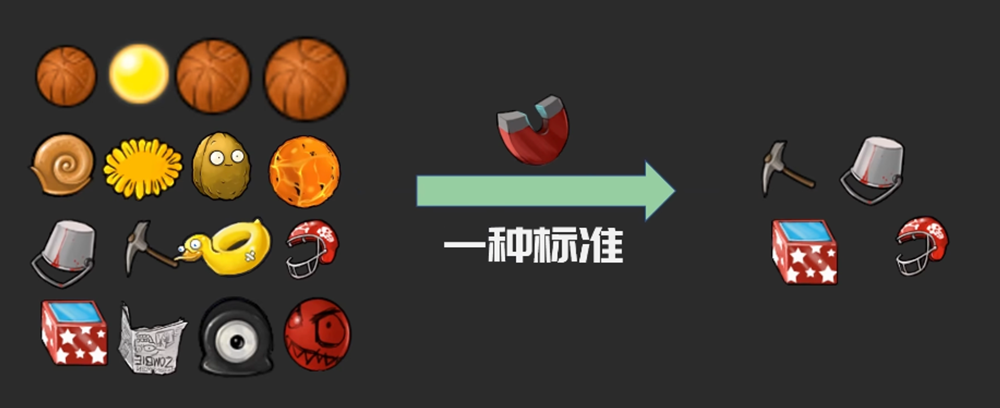

#### compress()

In [3]:
from itertools import compress
origin = ["a", "b", "c", "d"]
mask = [1, 0, 0, 1]

In [4]:
after_compress = compress(origin, mask)
print(list(after_compress))

['a', 'd']


#### filter()

例子：

In [43]:
def div_by_3(x):
    if x % 3 == 0:
        return True
    return False

origin = list(map(int, "10 21 33 44 55 66 999".split()))
after_filter = filter(div_by_3, origin)
print(list(after_filter))

[21, 33, 66, 999]


Better way

In [41]:
def div_by_3(x):
    return x % 3 == 0
print(list(filter(div_by_3, map(int, "10 21 33 44 55 66 999".split()))))

[21, 33, 66, 999]


 Much better

In [44]:
print(list(filter(lambda x: not x % 3, map(int, "10 21 33 44 55 66 999".split()))))

[21, 33, 66, 999]


#### filterfalse()

In [31]:
from itertools import filterfalse
def div_by_3(x):
    if x % 3 == 0:
        return True
    return False

origin = list(map(int, "10 21 33 44 55 66 999".split()))
after_filter = filterfalse(div_by_3, origin)
print(list(after_filter))

[10, 44, 55]


例子1:

In [23]:
from itertools import filterfalse
origin = ["a", "b", "c", "d"]
after_filterfalse = filterfalse(lambda x: x == "b" or x == "c", origin)
print(list(after_filterfalse))

['a', 'd']


In [32]:
origin = ["a", "b", "c", "d"]
after_filterfalse = filter(lambda x: x == "b" or x == "c", origin)
print(list(after_filterfalse))

['b', 'c']


例子2:

In [46]:
from itertools import filterfalse
origin = range(100)
after_filterfalse = filterfalse(lambda x: x % 10, origin)
print(list(after_filterfalse))

[0, 10, 20, 30, 40, 50, 60, 70, 80, 90]


In [40]:
origin = range(100)
after_filter = filter(lambda x: x % 10, origin)
print(list(after_filter))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99]


等价于

In [47]:
from itertools import filterfalse
origin = range(100)
after_filterfalse = filterfalse(lambda x: not x % 10, origin)
print(list(after_filterfalse))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99]


例子3

In [42]:
from itertools import filterfalse
origin = [0, 1, False, True]
after_filterfalse = filterfalse(None, origin)
print(list(after_filterfalse))

[0, False]


In [34]:
origin = [0, 1, False, True]
after_filter = filter(None, origin)
print(list(after_filter))

[1, True]


In [46]:
from itertools import filterfalse
origin = [0, 1, False, True]
after_filterfalse = filterfalse(lambda x: 0, origin)
print(list(after_filterfalse))

[0, 1, False, True]


In [35]:
origin = [0, 1, False, True]
after_filter = filter(lambda x: 0, origin)
print(list(after_filter))

[]


#### dropwhile()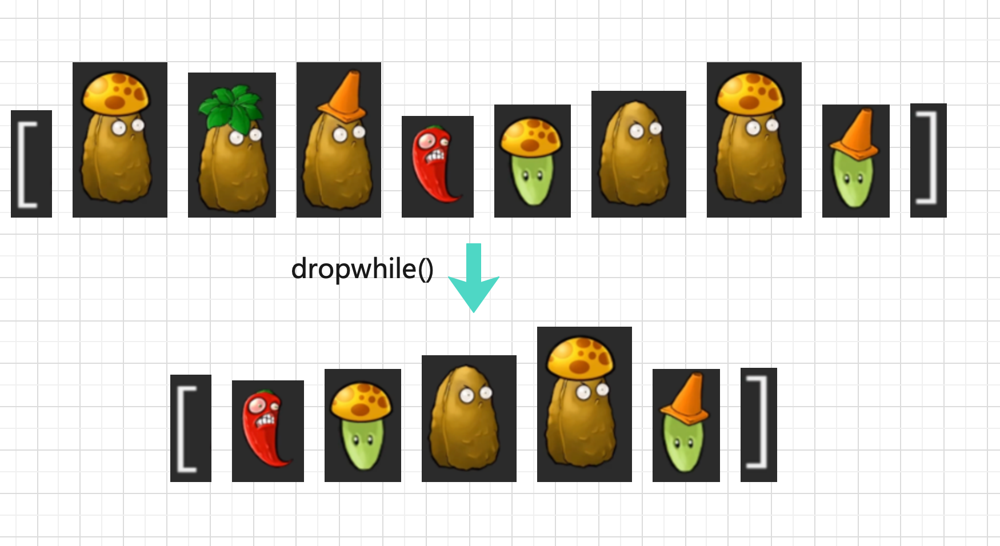

In [40]:
from itertools import dropwhile
from itertools import chain
l1 = range(1, 11)
l2 = [1, 2, 3, 3, 4]
origin = chain(l1, l2)

In [41]:
after_dropwhile = dropwhile(lambda x: x<4, origin)
print(list(after_dropwhile))
print(list(after_dropwhile)) # 第二次打印已经没有了，生成器

[4, 5, 6, 7, 8, 9, 10, 1, 2, 3, 3, 4]
[]


#### takewhile()

In [56]:
from itertools import takewhile
l1 = range(1, 11)
l2 = [1, 2, 3, 3, 4]
origin = chain(l1, l2)

In [57]:
after_takewhile = takewhile(lambda x: x<4, origin)
print(list(after_takewhile))

[1, 2, 3]


#### islice()

>itertools.islice的基本用法为：
>itertools.islice(iterable, start, stop[, step])
>可以返回从迭代器中的start位置到stop位置的元素。如果stop为None，则一直迭代到最后位置。

比如：

In [50]:
from itertools import islice
origin = "ABCDEF"
print(list(islice(origin, 2)))

['A', 'B']


In [51]:
from itertools import islice
origin = "ABCDEF"
print(list(islice(origin, 2, 4)))

['C', 'D']


In [53]:
from itertools import islice
origin = "ABCDEF"
print(list(islice(origin, 2, None)))

['C', 'D', 'E', 'F']


In [54]:
from itertools import islice
origin = "ABCDEF"
print(list(islice(origin, 2, None, 2)))

['C', 'E']


***
***另外，如果在读取文件时也可以使用，比如不想读取文件第一行：***



In [65]:
from itertools import islice
with open("exchanges.sql") as f:
    for line in islice(f, 14, None):
        print(line)

INSERT INTO market_data_ut.exchanges (code, name, category, id, create_user_id, create_time, update_user_id, update_time, version) VALUES ('usdt', 'Tether USDt', 'CRYPTO', 22, 0, '2024-02-02 17:19:02', null, '2024-02-02 17:19:02', 1);

INSERT INTO market_data_ut.exchanges (code, name, category, id, create_user_id, create_time, update_user_id, update_time, version) VALUES ('ine', '上期能源', 'FUTURE', 23, 0, '2024-02-02 17:19:02', null, '2024-02-02 17:19:02', 1);



***
## 分组

#### islice()

#### ***pairwise()***
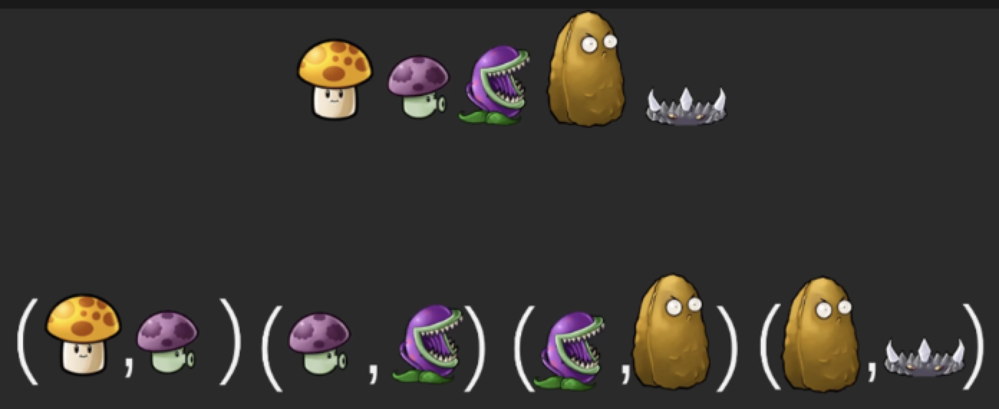

In [49]:
from itertools import pairwise
origin = "abcde"
paired = pairwise(origin)
print(list(paired))

[('a', 'b'), ('b', 'c'), ('c', 'd'), ('d', 'e')]


In [51]:
origin = ["a1", "a2", "a3", "a4", "a5"]
paired = pairwise(origin)
print(list(paired))

[('a1', 'a2'), ('a2', 'a3'), ('a3', 'a4'), ('a4', 'a5')]


In [70]:
from itertools import starmap
origin = [(2, 3),(3, 2),(4, 2)]
after_starmap = starmap(pow, origin)
print(list(after_starmap))

[8, 9, 16]


In [52]:
from itertools import starmap
origin = [(1, 2, 3, 4), (5, 6), (7, 8)]

def add_x(*args):
    temp = []
    for arg in args:
        temp.append(f"{arg}X")
    return temp

after_starmap = starmap(add_x, origin)
print(list(after_starmap))

[['1X', '2X', '3X', '4X'], ['5X', '6X'], ['7X', '8X']]


In [75]:
from itertools import starmap
from operator import pow
origin = [(2, 2), (2, 3), (19, 3)]
after_starmap = starmap(lambda x, y: x//y, origin)
print(list(after_starmap))

[1, 0, 6]


#### zip() v.s. **zip_longest()**

## 排列组合
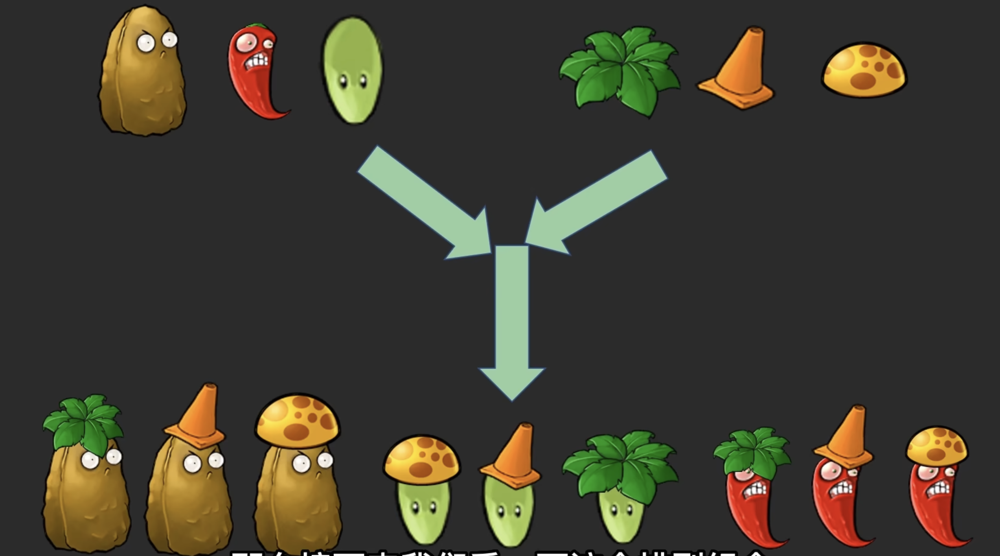

#### product()

##### product(x, y)

In [95]:
from itertools import product
origin_a = ["lantian", "sunyang", "lanxintian"]
origin_b = ["playing ball", "fire"]
for a, b in product(origin_a, origin_b):
    print(f"{a} love {b}")

lantian love playing ball
lantian love fire
sunyang love playing ball
sunyang love fire
lanxintian love playing ball
lanxintian love fire


##### product(x, repeat=n)

In [97]:
from itertools import product
for x, y, z in product(range(3), repeat=3):
    print((x, y, z), sep=" ")

0 0 0
0 0 1
0 0 2
0 1 0
0 1 1
0 1 2
0 2 0
0 2 1
0 2 2
1 0 0
1 0 1
1 0 2
1 1 0
1 1 1
1 1 2
1 2 0
1 2 1
1 2 2
2 0 0
2 0 1
2 0 2
2 1 0
2 1 1
2 1 2
2 2 0
2 2 1
2 2 2


In [98]:
from itertools import product
for x, y, z in product(range(3), repeat=3):
    setblock(x, y, z, 169)

NameError: name 'setblock' is not defined